<a href="https://colab.research.google.com/github/LonelyFort/pytorch_deeplearning_exercises/blob/main/extras/exercises/07_pytorch_experiment_tracking_exercise_template.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 07. PyTorch Experiment Tracking Exercise Template

Welcome to the 07. PyTorch Experiment Tracking exercise template notebook.

> **Note:** There may be more than one solution to each of the exercises. This notebook only shows one possible example.

## Resources

1. These exercises/solutions are based on [section 07. PyTorch Transfer Learning](https://www.learnpytorch.io/07_pytorch_experiment_tracking/) of the Learn PyTorch for Deep Learning course by Zero to Mastery.
2. See a live [walkthrough of the solutions (errors and all) on YouTube](https://youtu.be/cO_r2FYcAjU).
3. See [other solutions on the course GitHub](https://github.com/mrdbourke/pytorch-deep-learning/tree/main/extras/solutions).

> **Note:** The first section of this notebook is dedicated to getting various helper functions and datasets used for the exercises. The exercises start at the heading "Exercise 1: ...".

### Get various imports and helper functions

We'll need to make sure we have `torch` v.1.12+ and `torchvision` v0.13+.

In [1]:
# For this notebook to run with updated APIs, we need torch 1.12+ and torchvision 0.13+
try:
    import torch
    import torchvision
    assert int(torch.__version__.split(".")[1]) >= 12, "torch version should be 1.12+"
    assert int(torchvision.__version__.split(".")[1]) >= 13, "torchvision version should be 0.13+"
    print(f"torch version: {torch.__version__}")
    print(f"torchvision version: {torchvision.__version__}")
except:
    print(f"[INFO] torch/torchvision versions not as required, installing nightly versions.")
    !pip3 install -U --pre torch torchvision --extra-index-url https://download.pytorch.org/whl/nightly/cu113
    import torch
    import torchvision
    print(f"torch version: {torch.__version__}")
    print(f"torchvision version: {torchvision.__version__}")

[INFO] torch/torchvision versions not as required, installing nightly versions.
Looking in indexes: https://pypi.org/simple, https://download.pytorch.org/whl/nightly/cu113
torch version: 2.9.1+cu128
torchvision version: 0.24.1+cu128


In [2]:
 # Make sure we have a GPU
 device = "cuda" if torch.cuda.is_available() else "cpu"
 device

'cuda'

In [3]:
# Get regular imports
import matplotlib.pyplot as plt
import torch
import torchvision

from torch import nn
from torchvision import transforms

# Try to get torchinfo, install it if it doesn't work
try:
    from torchinfo import summary
except:
    print("[INFO] Couldn't find torchinfo... installing it.")
    !pip install -q torchinfo
    from torchinfo import summary

# Try to import the going_modular directory, download it from GitHub if it doesn't work
try:
    from going_modular.going_modular import data_setup, engine
except:
    # Get the going_modular scripts
    print("[INFO] Couldn't find going_modular scripts... downloading them from GitHub.")
    !git clone https://github.com/mrdbourke/pytorch-deep-learning
    !mv pytorch-deep-learning/going_modular .
    !rm -rf pytorch-deep-learning
    from going_modular.going_modular import data_setup, engine

[INFO] Couldn't find going_modular scripts... downloading them from GitHub.
Cloning into 'pytorch-deep-learning'...
remote: Enumerating objects: 4393, done.
remote: Total 4393 (delta 0), reused 0 (delta 0), pack-reused 4393 (from 1)
Receiving objects: 100% (4393/4393), 764.14 MiB | 30.38 MiB/s, done.
Resolving deltas: 100% (2657/2657), done.
Updating files: 100% (248/248), done.


In [4]:
# Set seeds
def set_seeds(seed: int=42):
    """Sets random sets for torch operations.

    Args:
        seed (int, optional): Random seed to set. Defaults to 42.
    """
    # Set the seed for general torch operations
    torch.manual_seed(seed)
    # Set the seed for CUDA torch operations (ones that happen on the GPU)
    torch.cuda.manual_seed(seed)

In [5]:
import os
import zipfile

from pathlib import Path

import requests

def download_data(source: str,
                  destination: str,
                  remove_source: bool = True) -> Path:
    """Downloads a zipped dataset from source and unzips to destination.

    Args:
        source (str): A link to a zipped file containing data.
        destination (str): A target directory to unzip data to.
        remove_source (bool): Whether to remove the source after downloading and extracting.

    Returns:
        pathlib.Path to downloaded data.

    Example usage:
        download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
                      destination="pizza_steak_sushi")
    """
    # Setup path to data folder
    data_path = Path("data/")
    image_path = data_path / destination

    # If the image folder doesn't exist, download it and prepare it...
    if image_path.is_dir():
        print(f"[INFO] {image_path} directory exists, skipping download.")
    else:
        print(f"[INFO] Did not find {image_path} directory, creating one...")
        image_path.mkdir(parents=True, exist_ok=True)

        # Download pizza, steak, sushi data
        target_file = Path(source).name
        with open(data_path / target_file, "wb") as f:
            request = requests.get(source)
            print(f"[INFO] Downloading {target_file} from {source}...")
            f.write(request.content)

        # Unzip pizza, steak, sushi data
        with zipfile.ZipFile(data_path / target_file, "r") as zip_ref:
            print(f"[INFO] Unzipping {target_file} data...")
            zip_ref.extractall(image_path)

        # Remove .zip file
        if remove_source:
            os.remove(data_path / target_file)

    return image_path

image_path = download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
                           destination="pizza_steak_sushi")
image_path

[INFO] Did not find data/pizza_steak_sushi directory, creating one...
[INFO] Downloading pizza_steak_sushi.zip from https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip...
[INFO] Unzipping pizza_steak_sushi.zip data...


PosixPath('data/pizza_steak_sushi')

In [6]:
from torch.utils.tensorboard import SummaryWriter
def create_writer(experiment_name: str,
                  model_name: str,
                  extra: str=None):
    """Creates a torch.utils.tensorboard.writer.SummaryWriter() instance saving to a specific log_dir.

    log_dir is a combination of runs/timestamp/experiment_name/model_name/extra.

    Where timestamp is the current date in YYYY-MM-DD format.

    Args:
        experiment_name (str): Name of experiment.
        model_name (str): Name of model.
        extra (str, optional): Anything extra to add to the directory. Defaults to None.

    Returns:
        torch.utils.tensorboard.writer.SummaryWriter(): Instance of a writer saving to log_dir.

    Example usage:
        # Create a writer saving to "runs/2022-06-04/data_10_percent/effnetb2/5_epochs/"
        writer = create_writer(experiment_name="data_10_percent",
                               model_name="effnetb2",
                               extra="5_epochs")
        # The above is the same as:
        writer = SummaryWriter(log_dir="runs/2022-06-04/data_10_percent/effnetb2/5_epochs/")
    """
    from datetime import datetime
    import os

    # Get timestamp of current date (all experiments on certain day live in same folder)
    timestamp = datetime.now().strftime("%Y-%m-%d") # returns current date in YYYY-MM-DD format

    if extra:
        # Create log directory path
        log_dir = os.path.join("runs", timestamp, experiment_name, model_name, extra)
    else:
        log_dir = os.path.join("runs", timestamp, experiment_name, model_name)

    print(f"[INFO] Created SummaryWriter, saving to: {log_dir}...")
    return SummaryWriter(log_dir=log_dir)

In [7]:
# Create a test writer
writer = create_writer(experiment_name="test_experiment_name",
                       model_name="this_is_the_model_name",
                       extra="add_a_little_extra_if_you_want")

[INFO] Created SummaryWriter, saving to: runs/2026-01-02/test_experiment_name/this_is_the_model_name/add_a_little_extra_if_you_want...


In [8]:
from typing import Dict, List
from tqdm.auto import tqdm

from going_modular.going_modular.engine import train_step, test_step

# Add writer parameter to train()
def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          epochs: int,
          device: torch.device,
          writer: torch.utils.tensorboard.writer.SummaryWriter # new parameter to take in a writer
          ) -> Dict[str, List]:
    """Trains and tests a PyTorch model.

    Passes a target PyTorch models through train_step() and test_step()
    functions for a number of epochs, training and testing the model
    in the same epoch loop.

    Calculates, prints and stores evaluation metrics throughout.

    Stores metrics to specified writer log_dir if present.

    Args:
      model: A PyTorch model to be trained and tested.
      train_dataloader: A DataLoader instance for the model to be trained on.
      test_dataloader: A DataLoader instance for the model to be tested on.
      optimizer: A PyTorch optimizer to help minimize the loss function.
      loss_fn: A PyTorch loss function to calculate loss on both datasets.
      epochs: An integer indicating how many epochs to train for.
      device: A target device to compute on (e.g. "cuda" or "cpu").
      writer: A SummaryWriter() instance to log model results to.

    Returns:
      A dictionary of training and testing loss as well as training and
      testing accuracy metrics. Each metric has a value in a list for
      each epoch.
      In the form: {train_loss: [...],
                train_acc: [...],
                test_loss: [...],
                test_acc: [...]}
      For example if training for epochs=2:
              {train_loss: [2.0616, 1.0537],
                train_acc: [0.3945, 0.3945],
                test_loss: [1.2641, 1.5706],
                test_acc: [0.3400, 0.2973]}
    """
    # Create empty results dictionary
    results = {"train_loss": [],
               "train_acc": [],
               "test_loss": [],
               "test_acc": []
    }

    # Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc = train_step(model=model,
                                          dataloader=train_dataloader,
                                          loss_fn=loss_fn,
                                          optimizer=optimizer,
                                          device=device)
        test_loss, test_acc = test_step(model=model,
          dataloader=test_dataloader,
          loss_fn=loss_fn,
          device=device)

        # Print out what's happening
        print(
          f"Epoch: {epoch+1} | "
          f"train_loss: {train_loss:.4f} | "
          f"train_acc: {train_acc:.4f} | "
          f"test_loss: {test_loss:.4f} | "
          f"test_acc: {test_acc:.4f}"
        )

        # Update results dictionary
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)


        ### New: Use the writer parameter to track experiments ###
        # See if there's a writer, if so, log to it
        if writer:
            # Add results to SummaryWriter
            writer.add_scalars(main_tag="Loss",
                               tag_scalar_dict={"train_loss": train_loss,
                                                "test_loss": test_loss},
                               global_step=epoch)
            writer.add_scalars(main_tag="Accuracy",
                               tag_scalar_dict={"train_acc": train_acc,
                                                "test_acc": test_acc},
                               global_step=epoch)

            # Close the writer
            writer.close()
        else:
            pass
    ### End new ###

    # Return the filled results at the end of the epochs
    return results

### Download data

Using the same data from https://www.learnpytorch.io/07_pytorch_experiment_tracking/

In [9]:
# Download 10 percent and 20 percent training data (if necessary)
data_10_percent_path = download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
                                     destination="pizza_steak_sushi")

data_20_percent_path = download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi_20_percent.zip",
                                     destination="pizza_steak_sushi_20_percent")

[INFO] data/pizza_steak_sushi directory exists, skipping download.
[INFO] Did not find data/pizza_steak_sushi_20_percent directory, creating one...
[INFO] Downloading pizza_steak_sushi_20_percent.zip from https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi_20_percent.zip...
[INFO] Unzipping pizza_steak_sushi_20_percent.zip data...


In [10]:
# Setup training directory paths
train_dir_10_percent = data_10_percent_path / "train"
train_dir_20_percent = data_20_percent_path / "train"

# Setup testing directory paths (note: use the same test dataset for both to compare the results)
test_dir = data_10_percent_path / "test"

# Check the directories
print(f"Training directory 10%: {train_dir_10_percent}")
print(f"Training directory 20%: {train_dir_20_percent}")
print(f"Testing directory: {test_dir}")

Training directory 10%: data/pizza_steak_sushi/train
Training directory 20%: data/pizza_steak_sushi_20_percent/train
Testing directory: data/pizza_steak_sushi/test


In [11]:
from torchvision import transforms

# Create a transform to normalize data distribution to be inline with ImageNet
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], # values per colour channel [red, green, blue]
                                 std=[0.229, 0.224, 0.225])

# Create a transform pipeline
simple_transform = transforms.Compose([
                                       transforms.Resize((224, 224)),
                                       transforms.ToTensor(), # get image values between 0 & 1
                                       normalize
])

### Turn data into DataLoaders

In [12]:
BATCH_SIZE = 32

# Create 10% training and test DataLoaders
train_dataloader_10_percent, test_dataloader, class_names = data_setup.create_dataloaders(train_dir=train_dir_10_percent,
                                                                                          test_dir=test_dir,
                                                                                          transform=simple_transform,
                                                                                          batch_size=BATCH_SIZE)

# Create 20% training and test DataLoaders
train_dataloader_20_percent, test_dataloader, class_names = data_setup.create_dataloaders(train_dir=train_dir_20_percent,
                                                                                          test_dir=test_dir,
                                                                                          transform=simple_transform,
                                                                                          batch_size=BATCH_SIZE)

# Find the number of samples/batches per dataloader (using the same test_dataloader for both experiments)
print(f"Number of batches of size {BATCH_SIZE} in 10 percent training data: {len(train_dataloader_10_percent)}")
print(f"Number of batches of size {BATCH_SIZE} in 20 percent training data: {len(train_dataloader_20_percent)}")
print(f"Number of batches of size {BATCH_SIZE} in testing data: {len(train_dataloader_10_percent)} (all experiments will use the same test set)")
print(f"Number of classes: {len(class_names)}, class names: {class_names}")

Number of batches of size 32 in 10 percent training data: 8
Number of batches of size 32 in 20 percent training data: 15
Number of batches of size 32 in testing data: 8 (all experiments will use the same test set)
Number of classes: 3, class names: ['pizza', 'steak', 'sushi']


## Exercise 1: Pick a larger model from [`torchvision.models`](https://pytorch.org/vision/main/models.html) to add to the list of experiments (for example, EffNetB3 or higher)

* How does it perform compared to our existing models?
* **Hint:** You'll need to set up an exerpiment similar to [07. PyTorch Experiment Tracking section 7.6](https://www.learnpytorch.io/07_pytorch_experiment_tracking/#76-create-experiments-and-set-up-training-code).

In [17]:
OUT_FEATURES = len(class_names)

def create_effnetb0():

  weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
  model = torchvision.models.efficientnet_b0(weights=weights).to(device)

  for param in model.parameters():
    param.requires_grad = False

  # Change classifier head
  model.classifier = nn.Sequential(
    nn.Dropout(p=0.3, inplace=True),
    nn.Linear(in_features=1280, out_features=OUT_FEATURES, bias=True)
  ).to(device)

  model.name = "effnetb0"
  return model

In [14]:
def create_densenet201():

  weights = torchvision.models.DenseNet201_Weights.DEFAULT
  model = torchvision.models.densenet201(weights=weights).to(device)

  for param in model.parameters():
    param.requires_grad = False

  model.classifier = nn.Sequential(
      nn.Linear(in_features=1920, out_features=OUT_FEATURES, bias=True)
  ).to(device)

  model.name = "densenet201"
  return model

In [23]:
%%time

num_epochs = [5, 10]

models = ["effnetb0", "densenet201"]

train_dataloaders = {"data_10%": train_dataloader_10_percent,
                     "data_20%": train_dataloader_20_percent}

from going_modular.going_modular.utils import save_model

set_seeds(42)

experiment_number = 0

for dataloader_name, train_dataloader in train_dataloaders.items():
  for epochs in num_epochs:
    for model_name in models:
      experiment_number += 1
      print(f"[INFO] Experiment number: {experiment_number}")
      print(f"[INFO] Model: {model_name}")
      print(f"[INFO] DataLoader: {dataloader_name}")
      print(f"[INFO] Number of epochs: {epochs}")

      if model_name == "effnetb0":
        model = create_effnetb0()
      elif model_name == "densenet201":
        model = create_densenet201()

      loss_fn = nn.CrossEntropyLoss()
      optimizer = torch.optim.Adam(params=model.parameters(), lr=0.001)

      train(model=model,
            train_dataloader=train_dataloader,
            test_dataloader=test_dataloader,
            optimizer=optimizer,
            loss_fn=loss_fn,
            epochs=epochs,
            device=device,
            writer=create_writer(experiment_name=dataloader_name,
                                 model_name=model_name,
                                 extra=f"{epochs}_epochs"))

      save_filepath = f"07_{model_name}_{dataloader_name}_{epochs}_epochs.pth"
      save_model(model=model,
                 target_dir="models",
                 model_name=save_filepath)
      print("-"*50 + "\n")

[INFO] Experiment number: 1
[INFO] Model: effnetb0
[INFO] DataLoader: data_10%
[INFO] Number of epochs: 5
[INFO] Created SummaryWriter, saving to: runs/2026-01-02/data_10%/effnetb0/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0393 | train_acc: 0.4336 | test_loss: 0.8904 | test_acc: 0.6316
Epoch: 2 | train_loss: 0.9207 | train_acc: 0.5898 | test_loss: 0.6903 | test_acc: 0.9167
Epoch: 3 | train_loss: 0.7739 | train_acc: 0.7070 | test_loss: 0.6603 | test_acc: 0.8655
Epoch: 4 | train_loss: 0.7085 | train_acc: 0.7500 | test_loss: 0.6595 | test_acc: 0.8456
Epoch: 5 | train_loss: 0.6979 | train_acc: 0.7656 | test_loss: 0.6281 | test_acc: 0.8561
[INFO] Saving model to: models/07_effnetb0_data_10%_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 2
[INFO] Model: densenet201
[INFO] DataLoader: data_10%
[INFO] Number of epochs: 5
[INFO] Created SummaryWriter, saving to: runs/2026-01-02/data_10%/densenet201/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0113 | train_acc: 0.4062 | test_loss: 0.7848 | test_acc: 0.7405
Epoch: 2 | train_loss: 0.9283 | train_acc: 0.5273 | test_loss: 0.7118 | test_acc: 0.8655
Epoch: 3 | train_loss: 0.7000 | train_acc: 0.7617 | test_loss: 0.8235 | test_acc: 0.6004
Epoch: 4 | train_loss: 0.7037 | train_acc: 0.6680 | test_loss: 0.5442 | test_acc: 0.9167
Epoch: 5 | train_loss: 0.6253 | train_acc: 0.7617 | test_loss: 0.5389 | test_acc: 0.8551
[INFO] Saving model to: models/07_densenet201_data_10%_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 3
[INFO] Model: effnetb0
[INFO] DataLoader: data_10%
[INFO] Number of epochs: 10
[INFO] Created SummaryWriter, saving to: runs/2026-01-02/data_10%/effnetb0/10_epochs...


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0917 | train_acc: 0.3242 | test_loss: 0.8963 | test_acc: 0.6515
Epoch: 2 | train_loss: 0.8831 | train_acc: 0.7266 | test_loss: 0.7160 | test_acc: 0.8750
Epoch: 3 | train_loss: 0.8392 | train_acc: 0.6367 | test_loss: 0.6517 | test_acc: 0.8750
Epoch: 4 | train_loss: 0.7822 | train_acc: 0.7188 | test_loss: 0.6793 | test_acc: 0.8352
Epoch: 5 | train_loss: 0.6739 | train_acc: 0.7656 | test_loss: 0.6509 | test_acc: 0.8759
Epoch: 6 | train_loss: 0.6343 | train_acc: 0.7891 | test_loss: 0.6357 | test_acc: 0.8551
Epoch: 7 | train_loss: 0.6433 | train_acc: 0.7578 | test_loss: 0.6099 | test_acc: 0.8561
Epoch: 8 | train_loss: 0.5672 | train_acc: 0.8164 | test_loss: 0.4982 | test_acc: 0.8968
Epoch: 9 | train_loss: 0.5073 | train_acc: 0.9258 | test_loss: 0.4822 | test_acc: 0.9072
Epoch: 10 | train_loss: 0.5535 | train_acc: 0.7812 | test_loss: 0.4819 | test_acc: 0.8864
[INFO] Saving model to: models/07_effnetb0_data_10%_10_epochs.pth
-------------------------------------------

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.1142 | train_acc: 0.3242 | test_loss: 0.9264 | test_acc: 0.4820
Epoch: 2 | train_loss: 0.9748 | train_acc: 0.4883 | test_loss: 0.7692 | test_acc: 0.8759
Epoch: 3 | train_loss: 0.9052 | train_acc: 0.6445 | test_loss: 0.8687 | test_acc: 0.6004
Epoch: 4 | train_loss: 0.7645 | train_acc: 0.7031 | test_loss: 0.5627 | test_acc: 0.8750
Epoch: 5 | train_loss: 0.7149 | train_acc: 0.6914 | test_loss: 0.6965 | test_acc: 0.7737
Epoch: 6 | train_loss: 0.5433 | train_acc: 0.9180 | test_loss: 0.5290 | test_acc: 0.8864
Epoch: 7 | train_loss: 0.5940 | train_acc: 0.7383 | test_loss: 0.4847 | test_acc: 0.8968
Epoch: 8 | train_loss: 0.5518 | train_acc: 0.7617 | test_loss: 0.6750 | test_acc: 0.7235
Epoch: 9 | train_loss: 0.5766 | train_acc: 0.7773 | test_loss: 0.5515 | test_acc: 0.8040
Epoch: 10 | train_loss: 0.4360 | train_acc: 0.8945 | test_loss: 0.4103 | test_acc: 0.8864
[INFO] Saving model to: models/07_densenet201_data_10%_10_epochs.pth
----------------------------------------

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9882 | train_acc: 0.4917 | test_loss: 0.7234 | test_acc: 0.8456
Epoch: 2 | train_loss: 0.7301 | train_acc: 0.8104 | test_loss: 0.6112 | test_acc: 0.8665
Epoch: 3 | train_loss: 0.5891 | train_acc: 0.8500 | test_loss: 0.5000 | test_acc: 0.8968
Epoch: 4 | train_loss: 0.5187 | train_acc: 0.8688 | test_loss: 0.4574 | test_acc: 0.9176
Epoch: 5 | train_loss: 0.4897 | train_acc: 0.8771 | test_loss: 0.4487 | test_acc: 0.8769
[INFO] Saving model to: models/07_effnetb0_data_20%_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 6
[INFO] Model: densenet201
[INFO] DataLoader: data_20%
[INFO] Number of epochs: 5
[INFO] Created SummaryWriter, saving to: runs/2026-01-02/data_20%/densenet201/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9665 | train_acc: 0.5687 | test_loss: 0.8374 | test_acc: 0.6922
Epoch: 2 | train_loss: 0.7344 | train_acc: 0.6979 | test_loss: 0.6032 | test_acc: 0.8362
Epoch: 3 | train_loss: 0.5200 | train_acc: 0.8458 | test_loss: 0.4418 | test_acc: 0.8968
Epoch: 4 | train_loss: 0.4319 | train_acc: 0.8958 | test_loss: 0.4225 | test_acc: 0.8873
Epoch: 5 | train_loss: 0.4188 | train_acc: 0.8896 | test_loss: 0.3594 | test_acc: 0.9176
[INFO] Saving model to: models/07_densenet201_data_20%_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 7
[INFO] Model: effnetb0
[INFO] DataLoader: data_20%
[INFO] Number of epochs: 10
[INFO] Created SummaryWriter, saving to: runs/2026-01-02/data_20%/effnetb0/10_epochs...


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9389 | train_acc: 0.5687 | test_loss: 0.7206 | test_acc: 0.8466
Epoch: 2 | train_loss: 0.7157 | train_acc: 0.7688 | test_loss: 0.5562 | test_acc: 0.9072
Epoch: 3 | train_loss: 0.5935 | train_acc: 0.8083 | test_loss: 0.5093 | test_acc: 0.8873
Epoch: 4 | train_loss: 0.4877 | train_acc: 0.8688 | test_loss: 0.4434 | test_acc: 0.9280
Epoch: 5 | train_loss: 0.4964 | train_acc: 0.8104 | test_loss: 0.3810 | test_acc: 0.9176
Epoch: 6 | train_loss: 0.4960 | train_acc: 0.8313 | test_loss: 0.4393 | test_acc: 0.8873
Epoch: 7 | train_loss: 0.3763 | train_acc: 0.9104 | test_loss: 0.3334 | test_acc: 0.9384
Epoch: 8 | train_loss: 0.4150 | train_acc: 0.8396 | test_loss: 0.3382 | test_acc: 0.9280
Epoch: 9 | train_loss: 0.3958 | train_acc: 0.8688 | test_loss: 0.3355 | test_acc: 0.8977
Epoch: 10 | train_loss: 0.3951 | train_acc: 0.8479 | test_loss: 0.3208 | test_acc: 0.8977
[INFO] Saving model to: models/07_effnetb0_data_20%_10_epochs.pth
-------------------------------------------

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9221 | train_acc: 0.5875 | test_loss: 0.6478 | test_acc: 0.8864
Epoch: 2 | train_loss: 0.6497 | train_acc: 0.8042 | test_loss: 0.4604 | test_acc: 0.9271
Epoch: 3 | train_loss: 0.4518 | train_acc: 0.8729 | test_loss: 0.4296 | test_acc: 0.8873
Epoch: 4 | train_loss: 0.3979 | train_acc: 0.9313 | test_loss: 0.3872 | test_acc: 0.8977
Epoch: 5 | train_loss: 0.3487 | train_acc: 0.9167 | test_loss: 0.4005 | test_acc: 0.8977
Epoch: 6 | train_loss: 0.3014 | train_acc: 0.9250 | test_loss: 0.2951 | test_acc: 0.9280
Epoch: 7 | train_loss: 0.2849 | train_acc: 0.9250 | test_loss: 0.3116 | test_acc: 0.8977
Epoch: 8 | train_loss: 0.3073 | train_acc: 0.8896 | test_loss: 0.2714 | test_acc: 0.9280
Epoch: 9 | train_loss: 0.2196 | train_acc: 0.9583 | test_loss: 0.3250 | test_acc: 0.8977
Epoch: 10 | train_loss: 0.2743 | train_acc: 0.8875 | test_loss: 0.3154 | test_acc: 0.8977
[INFO] Saving model to: models/07_densenet201_data_20%_10_epochs.pth
----------------------------------------

In [24]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

## Exercise 2. Introduce data augmentation to the list of experiments using the 20% pizza, steak, sushi training and test datasets, does this change anything?
    
* For example, you could have one training DataLoader that uses data augmentation (e.g. `train_dataloader_20_percent_aug` and `train_dataloader_20_percent_no_aug`) and then compare the results of two of the same model types training on these two DataLoaders.
* **Note:** You may need to alter the `create_dataloaders()` function to be able to take a transform for the training data and the testing data (because you don't need to perform data augmentation on the test data). See [04. PyTorch Custom Datasets section 6](https://www.learnpytorch.io/04_pytorch_custom_datasets/#6-other-forms-of-transforms-data-augmentation) for examples of using data augmentation or the script below for an example:

```python
# Note: Data augmentation transform like this should only be performed on training data
train_transform_data_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.TrivialAugmentWide(),
    transforms.ToTensor(),
    normalize
])

# Create a helper function to visualize different augmented (and not augmented) images
def view_dataloader_images(dataloader, n=10):
    if n > 10:
        print(f"Having n higher than 10 will create messy plots, lowering to 10.")
        n = 10
    imgs, labels = next(iter(dataloader))
    plt.figure(figsize=(16, 8))
    for i in range(n):
        # Min max scale the image for display purposes
        targ_image = imgs[i]
        sample_min, sample_max = targ_image.min(), targ_image.max()
        sample_scaled = (targ_image - sample_min)/(sample_max - sample_min)

        # Plot images with appropriate axes information
        plt.subplot(1, 10, i+1)
        plt.imshow(sample_scaled.permute(1, 2, 0)) # resize for Matplotlib requirements
        plt.title(class_names[labels[i]])
        plt.axis(False)

# Have to update `create_dataloaders()` to handle different augmentations
import os
from torch.utils.data import DataLoader
from torchvision import datasets

NUM_WORKERS = os.cpu_count() # use maximum number of CPUs for workers to load data

# Note: this is an update version of data_setup.create_dataloaders to handle
# differnt train and test transforms.
def create_dataloaders(
    train_dir,
    test_dir,
    train_transform, # add parameter for train transform (transforms on train dataset)
    test_transform,  # add parameter for test transform (transforms on test dataset)
    batch_size=32, num_workers=NUM_WORKERS
):
    # Use ImageFolder to create dataset(s)
    train_data = datasets.ImageFolder(train_dir, transform=train_transform)
    test_data = datasets.ImageFolder(test_dir, transform=test_transform)

    # Get class names
    class_names = train_data.classes

    # Turn images into data loaders
    train_dataloader = DataLoader(
        train_data,
        batch_size=batch_size,
        shuffle=True,
        num_workers=num_workers,
        pin_memory=True,
    )
    test_dataloader = DataLoader(
        test_data,
        batch_size=batch_size,
        shuffle=True,
        num_workers=num_workers,
        pin_memory=True,
    )

    return train_dataloader, test_dataloader, class_names
```

In [25]:
# Note: Data augmentation transform like this should only be performed on training data
train_transform_data_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.TrivialAugmentWide(),
    transforms.ToTensor(),
    normalize
])

# Create a helper function to visualize different augmented (and not augmented) images
def view_dataloader_images(dataloader, n=10):
    if n > 10:
        print(f"Having n higher than 10 will create messy plots, lowering to 10.")
        n = 10
    imgs, labels = next(iter(dataloader))
    plt.figure(figsize=(16, 8))
    for i in range(n):
        # Min max scale the image for display purposes
        targ_image = imgs[i]
        sample_min, sample_max = targ_image.min(), targ_image.max()
        sample_scaled = (targ_image - sample_min)/(sample_max - sample_min)

        # Plot images with appropriate axes information
        plt.subplot(1, 10, i+1)
        plt.imshow(sample_scaled.permute(1, 2, 0)) # resize for Matplotlib requirements
        plt.title(class_names[labels[i]])
        plt.axis(False)

# Have to update `create_dataloaders()` to handle different augmentations
import os
from torch.utils.data import DataLoader
from torchvision import datasets

NUM_WORKERS = os.cpu_count() # use maximum number of CPUs for workers to load data

# Note: this is an update version of data_setup.create_dataloaders to handle
# differnt train and test transforms.
def create_dataloaders(
    train_dir,
    test_dir,
    train_transform, # add parameter for train transform (transforms on train dataset)
    test_transform,  # add parameter for test transform (transforms on test dataset)
    batch_size=32, num_workers=NUM_WORKERS
):
    # Use ImageFolder to create dataset(s)
    train_data = datasets.ImageFolder(train_dir, transform=train_transform)
    test_data = datasets.ImageFolder(test_dir, transform=test_transform)

    # Get class names
    class_names = train_data.classes

    # Turn images into data loaders
    train_dataloader = DataLoader(
        train_data,
        batch_size=batch_size,
        shuffle=True,
        num_workers=num_workers,
        pin_memory=True,
    )
    test_dataloader = DataLoader(
        test_data,
        batch_size=batch_size,
        shuffle=True,
        num_workers=num_workers,
        pin_memory=True,
    )

    return train_dataloader, test_dataloader, class_names

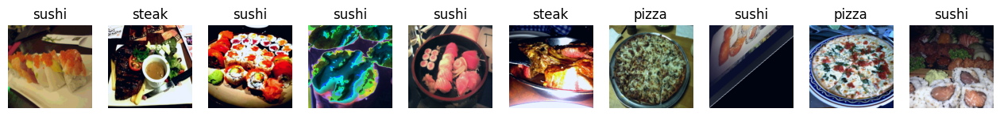

In [28]:
train_dataloader_20_percent_aug, test_dataloader, class_names = create_dataloaders(
    train_dir=train_dir_20_percent,
    test_dir=test_dir,
    train_transform=train_transform_data_aug,
    test_transform=simple_transform,
    batch_size=BATCH_SIZE
)

view_dataloader_images(train_dataloader_20_percent_aug)

In [29]:
%%time

num_epochs = [5, 10]

models = ["effnetb0", "densenet201"]

train_dataloaders = {"data_20%": train_dataloader_10_percent,
                     "data_20%_augmented": train_dataloader_20_percent_aug}

set_seeds(42)

experiment_number = 0

for dataloader_name, train_dataloader in train_dataloaders.items():
  for epochs in num_epochs:
    for model_name in models:
      experiment_number += 1
      print(f"[INFO] Experiment number: {experiment_number}")
      print(f"[INFO] Model: {model_name}")
      print(f"[INFO] DataLoader: {dataloader_name}")
      print(f"[INFO] Number of epochs: {epochs}")

      if model_name == "effnetb0":
        model = create_effnetb0()
      elif model_name == "densenet201":
        model = create_densenet201()

      loss_fn = nn.CrossEntropyLoss()
      optimizer = torch.optim.Adam(params=model.parameters(), lr=0.001)

      train(model=model,
            train_dataloader=train_dataloader,
            test_dataloader=test_dataloader,
            optimizer=optimizer,
            loss_fn=loss_fn,
            epochs=epochs,
            device=device,
            writer=create_writer(experiment_name=dataloader_name,
                                 model_name=model_name,
                                 extra=f"{epochs}_epochs"))

      save_filepath = f"07_{model_name}_{dataloader_name}_{epochs}_epochs.pth"
      save_model(model=model,
                 target_dir="models",
                 model_name=save_filepath)
      print("-"*50 + "\n")

[INFO] Experiment number: 1
[INFO] Model: effnetb0
[INFO] DataLoader: data_20%
[INFO] Number of epochs: 5
[INFO] Created SummaryWriter, saving to: runs/2026-01-02/data_20%/effnetb0/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0393 | train_acc: 0.4336 | test_loss: 0.8591 | test_acc: 0.7112
Epoch: 2 | train_loss: 0.8542 | train_acc: 0.7305 | test_loss: 0.6806 | test_acc: 0.8958
Epoch: 3 | train_loss: 0.7860 | train_acc: 0.6406 | test_loss: 0.6213 | test_acc: 0.8759
Epoch: 4 | train_loss: 0.7134 | train_acc: 0.7344 | test_loss: 0.6329 | test_acc: 0.8172
Epoch: 5 | train_loss: 0.6505 | train_acc: 0.7539 | test_loss: 0.6134 | test_acc: 0.8466
[INFO] Saving model to: models/07_effnetb0_data_20%_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 2
[INFO] Model: densenet201
[INFO] DataLoader: data_20%
[INFO] Number of epochs: 5
[INFO] Created SummaryWriter, saving to: runs/2026-01-02/data_20%/densenet201/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0576 | train_acc: 0.3906 | test_loss: 0.9269 | test_acc: 0.6098
Epoch: 2 | train_loss: 0.9286 | train_acc: 0.4922 | test_loss: 0.7540 | test_acc: 0.8646
Epoch: 3 | train_loss: 0.7467 | train_acc: 0.7344 | test_loss: 0.6568 | test_acc: 0.6799
Epoch: 4 | train_loss: 0.7320 | train_acc: 0.6797 | test_loss: 0.6189 | test_acc: 0.8873
Epoch: 5 | train_loss: 0.5827 | train_acc: 0.8359 | test_loss: 0.5072 | test_acc: 0.9072
[INFO] Saving model to: models/07_densenet201_data_20%_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 3
[INFO] Model: effnetb0
[INFO] DataLoader: data_20%
[INFO] Number of epochs: 10
[INFO] Created SummaryWriter, saving to: runs/2026-01-02/data_20%/effnetb0/10_epochs...


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0684 | train_acc: 0.4141 | test_loss: 0.8350 | test_acc: 0.7831
Epoch: 2 | train_loss: 0.8602 | train_acc: 0.8008 | test_loss: 0.7356 | test_acc: 0.7519
Epoch: 3 | train_loss: 0.8273 | train_acc: 0.7070 | test_loss: 0.7277 | test_acc: 0.6818
Epoch: 4 | train_loss: 0.7397 | train_acc: 0.7422 | test_loss: 0.5941 | test_acc: 0.8258
Epoch: 5 | train_loss: 0.6935 | train_acc: 0.7656 | test_loss: 0.6118 | test_acc: 0.8655
Epoch: 6 | train_loss: 0.5940 | train_acc: 0.7930 | test_loss: 0.5889 | test_acc: 0.8456
Epoch: 7 | train_loss: 0.5759 | train_acc: 0.7891 | test_loss: 0.5974 | test_acc: 0.7642
Epoch: 8 | train_loss: 0.5845 | train_acc: 0.8008 | test_loss: 0.5448 | test_acc: 0.8655
Epoch: 9 | train_loss: 0.5348 | train_acc: 0.7812 | test_loss: 0.4430 | test_acc: 0.9375
Epoch: 10 | train_loss: 0.5473 | train_acc: 0.7852 | test_loss: 0.4384 | test_acc: 0.8864
[INFO] Saving model to: models/07_effnetb0_data_20%_10_epochs.pth
-------------------------------------------

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0158 | train_acc: 0.5195 | test_loss: 0.8014 | test_acc: 0.7831
Epoch: 2 | train_loss: 0.8137 | train_acc: 0.6562 | test_loss: 0.6816 | test_acc: 0.8333
Epoch: 3 | train_loss: 0.6712 | train_acc: 0.7383 | test_loss: 0.6358 | test_acc: 0.8343
Epoch: 4 | train_loss: 0.7170 | train_acc: 0.6719 | test_loss: 0.6443 | test_acc: 0.7311
Epoch: 5 | train_loss: 0.5361 | train_acc: 0.8438 | test_loss: 0.6065 | test_acc: 0.6695
Epoch: 6 | train_loss: 0.6424 | train_acc: 0.7188 | test_loss: 0.5119 | test_acc: 0.8769
Epoch: 7 | train_loss: 0.6595 | train_acc: 0.7773 | test_loss: 0.5627 | test_acc: 0.7737
Epoch: 8 | train_loss: 0.4700 | train_acc: 0.8320 | test_loss: 0.4454 | test_acc: 0.8769
Epoch: 9 | train_loss: 0.4844 | train_acc: 0.7969 | test_loss: 0.4291 | test_acc: 0.9176
Epoch: 10 | train_loss: 0.3920 | train_acc: 0.9453 | test_loss: 0.5212 | test_acc: 0.7841
[INFO] Saving model to: models/07_densenet201_data_20%_10_epochs.pth
----------------------------------------

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9986 | train_acc: 0.5708 | test_loss: 0.7520 | test_acc: 0.7547
Epoch: 2 | train_loss: 0.7322 | train_acc: 0.8208 | test_loss: 0.5949 | test_acc: 0.9271
Epoch: 3 | train_loss: 0.6049 | train_acc: 0.8458 | test_loss: 0.5063 | test_acc: 0.8561
Epoch: 4 | train_loss: 0.5218 | train_acc: 0.8729 | test_loss: 0.4252 | test_acc: 0.9072
Epoch: 5 | train_loss: 0.5558 | train_acc: 0.8021 | test_loss: 0.3292 | test_acc: 0.9375
[INFO] Saving model to: models/07_effnetb0_data_20%_augmented_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 6
[INFO] Model: densenet201
[INFO] DataLoader: data_20%_augmented
[INFO] Number of epochs: 5
[INFO] Created SummaryWriter, saving to: runs/2026-01-02/data_20%_augmented/densenet201/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9686 | train_acc: 0.5563 | test_loss: 0.6377 | test_acc: 0.9167
Epoch: 2 | train_loss: 0.7033 | train_acc: 0.7458 | test_loss: 0.6549 | test_acc: 0.7737
Epoch: 3 | train_loss: 0.5923 | train_acc: 0.8354 | test_loss: 0.4190 | test_acc: 0.9479
Epoch: 4 | train_loss: 0.5016 | train_acc: 0.8375 | test_loss: 0.4333 | test_acc: 0.9176
Epoch: 5 | train_loss: 0.4956 | train_acc: 0.8063 | test_loss: 0.4176 | test_acc: 0.8958
[INFO] Saving model to: models/07_densenet201_data_20%_augmented_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 7
[INFO] Model: effnetb0
[INFO] DataLoader: data_20%_augmented
[INFO] Number of epochs: 10
[INFO] Created SummaryWriter, saving to: runs/2026-01-02/data_20%_augmented/effnetb0/10_epochs...


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9868 | train_acc: 0.5396 | test_loss: 0.7844 | test_acc: 0.8267
Epoch: 2 | train_loss: 0.7649 | train_acc: 0.7937 | test_loss: 0.5907 | test_acc: 0.9280
Epoch: 3 | train_loss: 0.6055 | train_acc: 0.8187 | test_loss: 0.4956 | test_acc: 0.8977
Epoch: 4 | train_loss: 0.5266 | train_acc: 0.8458 | test_loss: 0.3972 | test_acc: 0.9384
Epoch: 5 | train_loss: 0.5318 | train_acc: 0.8146 | test_loss: 0.3493 | test_acc: 0.9583
Epoch: 6 | train_loss: 0.4521 | train_acc: 0.8521 | test_loss: 0.3195 | test_acc: 0.9280
Epoch: 7 | train_loss: 0.4842 | train_acc: 0.8271 | test_loss: 0.3199 | test_acc: 0.9081
Epoch: 8 | train_loss: 0.4182 | train_acc: 0.8771 | test_loss: 0.2836 | test_acc: 0.9479
Epoch: 9 | train_loss: 0.4324 | train_acc: 0.8229 | test_loss: 0.2410 | test_acc: 0.9583
Epoch: 10 | train_loss: 0.4066 | train_acc: 0.8792 | test_loss: 0.2697 | test_acc: 0.9375
[INFO] Saving model to: models/07_effnetb0_data_20%_augmented_10_epochs.pth
---------------------------------

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0162 | train_acc: 0.4896 | test_loss: 0.7584 | test_acc: 0.7027
Epoch: 2 | train_loss: 0.8049 | train_acc: 0.6771 | test_loss: 0.6546 | test_acc: 0.7519
Epoch: 3 | train_loss: 0.5629 | train_acc: 0.8542 | test_loss: 0.4839 | test_acc: 0.8371
Epoch: 4 | train_loss: 0.4798 | train_acc: 0.8833 | test_loss: 0.4306 | test_acc: 0.8561
Epoch: 5 | train_loss: 0.4668 | train_acc: 0.8667 | test_loss: 0.3893 | test_acc: 0.9081
Epoch: 6 | train_loss: 0.4402 | train_acc: 0.8771 | test_loss: 0.4030 | test_acc: 0.8759
Epoch: 7 | train_loss: 0.4467 | train_acc: 0.8417 | test_loss: 0.3173 | test_acc: 0.8864
Epoch: 8 | train_loss: 0.3955 | train_acc: 0.8917 | test_loss: 0.3085 | test_acc: 0.9280
Epoch: 9 | train_loss: 0.4200 | train_acc: 0.8438 | test_loss: 0.2898 | test_acc: 0.9167
Epoch: 10 | train_loss: 0.3690 | train_acc: 0.8562 | test_loss: 0.3020 | test_acc: 0.9271
[INFO] Saving model to: models/07_densenet201_data_20%_augmented_10_epochs.pth
------------------------------

## Exercise 3. Scale up the dataset to turn FoodVision Mini into FoodVision Big using the entire [Food101 dataset from `torchvision.models`](https://pytorch.org/vision/stable/generated/torchvision.datasets.Food101.html#torchvision.datasets.Food101)
    
* You could take the best performing model from your various experiments or even the EffNetB2 feature extractor we created in this notebook and see how it goes fitting for 5 epochs on all of Food101.
* If you try more than one model, it would be good to have the model's results tracked.
* If you load the Food101 dataset from `torchvision.models`, you'll have to create PyTorch DataLoaders to use it in training.
* **Note:** Due to the larger amount of data in Food101 compared to our pizza, steak, sushi dataset, this model will take longer to train.

In [31]:
model_densenet_path = "models/07_densenet201_data_20%_augmented_10_epochs.pth"

model_densenet = create_densenet201()

model_densenet.load_state_dict(torch.load(model_densenet_path))

<All keys matched successfully>

In [33]:
# get model file size
from pathlib import Path

effnetb2_model_size = Path(model_densenet_path).stat().st_size / (1024*1024)
print(f"[INFO] EffNetB2 model size: {effnetb2_model_size:.2f} MB")

[INFO] EffNetB2 model size: 70.39 MB


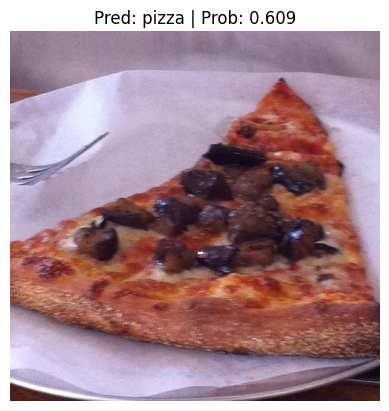

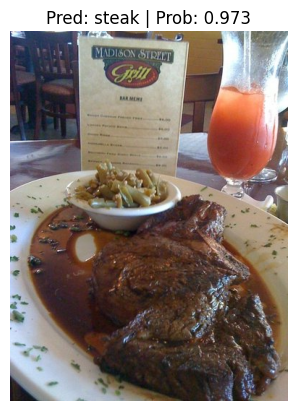

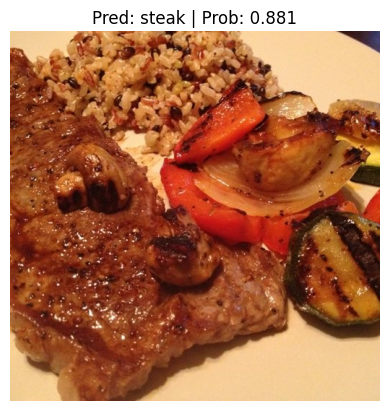

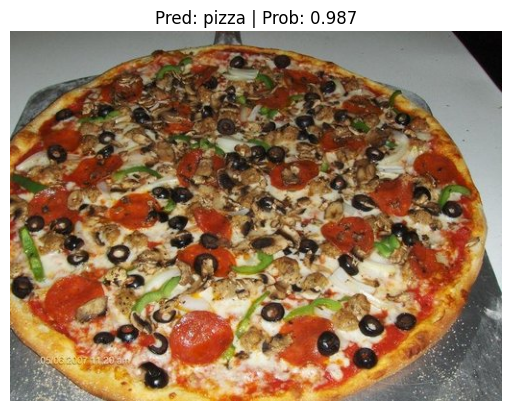

In [35]:
from going_modular.going_modular.predictions import pred_and_plot_image

import random
num_images_to_plot = 4
test_image_path_list = list(Path(data_20_percent_path/ "test").glob("*/*.jpg"))

test_image_path_sample = random.sample(test_image_path_list, k=num_images_to_plot)

for image_path in test_image_path_sample:
  pred_and_plot_image(model=model_densenet,
                      image_path=image_path,
                      class_names=class_names,
                      image_size=(224,224))